# Roget's Thesaurus (Embedding's Section Prediction)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook
---

The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the section prediction of the embeddings we created in notebook <b>Roget's Data and Embeddings</b>

This Jupyter Notebook is focused on the application of machine learning and deep learning models to predict the categories of word embeddings previously generated from textual data extracted from Gutenberg's website.

## 2. Libraries

In [1]:
# Data Loading, Manipulation and Normalization
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from keras.utils import to_categorical

# Vector DB and Dimensionality Reduction
import faiss
from umap import UMAP

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank

# Split and Reports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Machine Learning Models and Ensemble Models
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Model validation and Hyperparameter tuning
from sklearn.model_selection import cross_val_score
import optuna

# Save the model
from joblib import dump

# Deep learning
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Reshape, Dense, LSTM, GRU, Bidirectional
from tensorflow.keras.layers import LayerNormalization, Add, Dropout, BatchNormalization

# Mixed Presicion
from tensorflow.keras import mixed_precision

# Callbacks and Regularization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# Visualize the model's architecture
from keras.utils import plot_model

# Helper functions
import helper_functions as hf

2024-09-18 22:12:10.216712: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-18 22:12:10.476776: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-18 22:12:10.476823: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-18 22:12:10.520110: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-18 22:12:10.610440: I tensorflow/core/platform/cpu_feature_guar

In [2]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", category=ConvergenceWarning)

## 3. Data loading and Preparation

### Words Loading

* Loading the word along with the classes and the embeddings

In [3]:
roget_words = pd.read_csv("Dataset/Roget's_Words.csv")
print(roget_words.shape)
roget_words.head()

(94214, 7)


,Class,Division,Section,Category,Sub-Category,Word,Final_Words
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,existence,"Existence, existence"
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,being,"Existence, being"
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,entity,"Existence, entity"
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,ens,"Existence, ens"
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,esse,"Existence, esse"


### VectorDB's Embeddings

* Retrieve the vectorDBs and the parameters

In [4]:
index_st = faiss.read_index('Embeddings/ST_vectordb.faiss')
index_use = faiss.read_index('Embeddings/USE_vectordb.faiss')
index_gemma2b = faiss.read_index('Embeddings/Gemma1.1_2B_vectordb.faiss')
index_gemma7b = faiss.read_index('Embeddings/Gemma1.1_7B_vectordb.faiss')

In [5]:
index_st.ntotal, index_use.ntotal, index_gemma2b.ntotal, index_gemma7b.ntotal

(94214, 94214, 94214, 94214)

In [6]:
d_st = index_st.d
d_use = index_use.d
d_gemma2b = index_gemma2b.d
d_gemma7b = index_gemma7b.d

d_st, d_use, d_gemma2b, d_gemma7b

(384, 512, 2048, 3072)

* Retrieve the embeddings

In [7]:
embeddings_st = np.zeros((index_st.ntotal, d_st), dtype=np.float32)
embeddings_use = np.zeros((index_use.ntotal, d_use), dtype=np.float32)
embeddings_gemma2b = np.zeros((index_gemma2b.ntotal, d_gemma2b), dtype=np.float32)
embeddings_gemma7b = np.zeros((index_gemma7b.ntotal, d_gemma7b), dtype=np.float32)

In [8]:
for i in range(index_st.ntotal):
    embeddings_st[i] = index_st.reconstruct(i)
    embeddings_use[i] = index_use.reconstruct(i)
    embeddings_gemma2b[i] = index_gemma2b.reconstruct(i)
    embeddings_gemma7b[i] = index_gemma7b.reconstruct(i)

In [9]:
scaler = StandardScaler()

embeddings_st = scaler.fit_transform(embeddings_st)
embeddings_use = scaler.fit_transform(embeddings_use)
embeddings_gemma2b = scaler.fit_transform(embeddings_gemma2b)
embeddings_gemma7b = scaler.fit_transform(embeddings_gemma7b)

In [10]:
embeddings_st = pd.DataFrame(embeddings_st)
embeddings_use = pd.DataFrame(embeddings_use)
embeddings_gemma2b = pd.DataFrame(embeddings_gemma2b)
embeddings_gemma7b = pd.DataFrame(embeddings_gemma7b)

## 4. Modeling

Seven different models where chosen in the section prediction notebook where with all these model we will follow a specific pattern to find the best parameters and optimize the accuracy. The pattern is the following:

We will first initialize the model without parameters in order to see the score it can hit without any optimization. Then we will use the optuna to modify some of the parameters and find the best combination. If the optuna goes better than the befault then we will take the parameters of the best trial that optuna had and train a model with this parameters. The best model that we will save will be the model with the highest score.

In [11]:
umap = UMAP(n_components=300, n_jobs=-1)
X = umap.fit_transform(embeddings_gemma7b)

y = roget_words['Section']

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=33)

### SGD

In [18]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train, y_train)

SGDClassifier(random_state=33)

In [19]:
sgd.score(X_test, y_test)

0.7368830709357863

In [20]:
print(classification_report(y_test, sgd.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       1.00      0.54      0.70       355
                            SECTION I. EXISTENCE       1.00      0.23      0.37       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.91      0.72      0.80       797
                    SECTION I. MATTER IN GENERAL       0.89      0.67      0.76       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.37      0.53       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.96      0.37      0.53       123
                     SECTION I. SPACE IN GENERAL       0.98      0.80      0.88       444
                  SECTION I. VOLITION IN GENERAL       0.13      0.96      0.22       648
                          SECTION II. DIMENSIONS       0.99      0.72      0.84      1259
                    SECTION II. INORGANIC MATTER       0.98      0.83      0.90       676
         

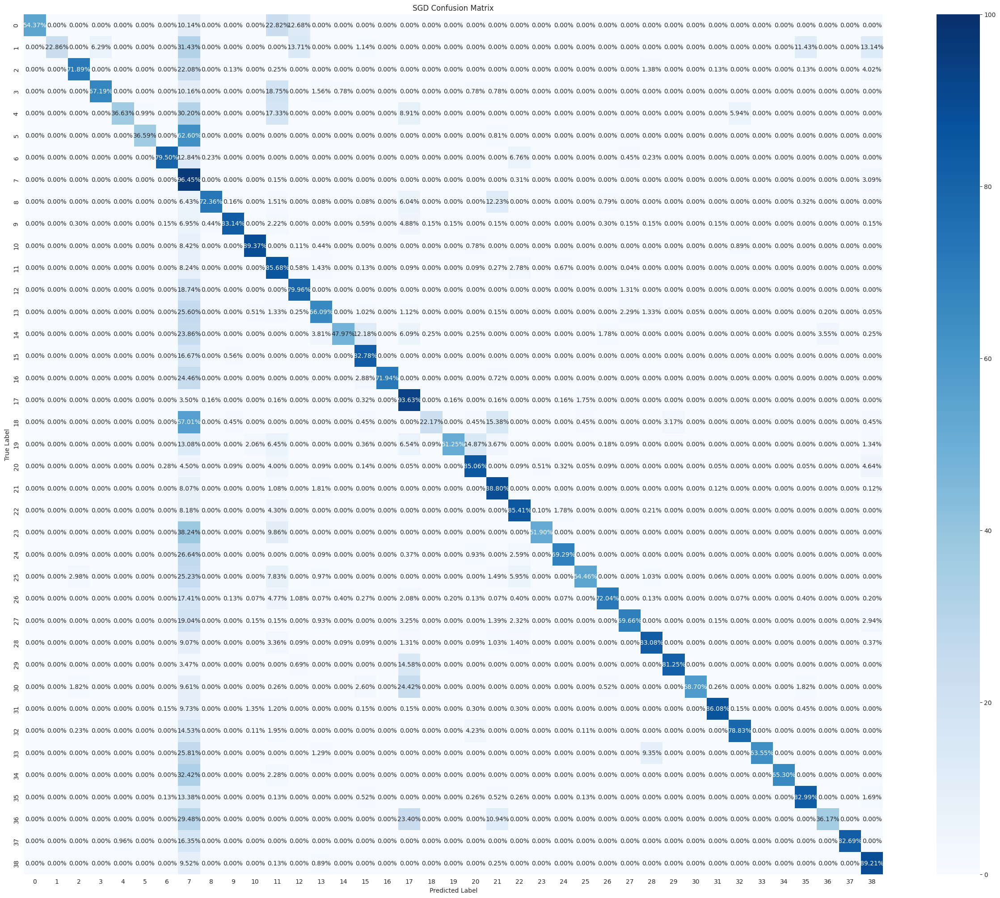

In [21]:
hf.confusion_matrix_plot(y_test, sgd.predict(X_test), 'SGD', 'Section/SGD_cm', figsize=(31,25))

In [23]:
def objective_sgd_section(trial):

    params = {
        'alpha': trial.suggest_float('alpha', 0.01, 1),
        'epsilon': trial.suggest_float('epsilon', 0.01, 1),
        'l1_ratio': trial.suggest_float('l1_ratio', 0.01, 1),
        'penalty': trial.suggest_categorical('penalty', [None, 'l1', 'l2']),
        'warm_start': trial.suggest_categorical('warm_start', [True, False]),
        'max_iter': trial.suggest_int('max_iter', 50, 250),
        'random_state': 33
    }
    
    sgd = SGDClassifier(**params)

    score = cross_val_score(sgd, X_train, y_train.to_numpy(), cv=5, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [24]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd_section, n_trials=30, n_jobs=-1)

[I 2024-09-18 22:23:34,651] A new study created in memory with name: no-name-f0666a9a-529f-4383-8a14-95a62c1952f0
[I 2024-09-18 22:24:11,529] Trial 12 finished with value: 0.5674839791999341 and parameters: {'alpha': 0.5011637649676847, 'epsilon': 0.23849049003173842, 'l1_ratio': 0.872226331316503, 'penalty': 'l2', 'warm_start': False, 'max_iter': 128}. Best is trial 12 with value: 0.5674839791999341.
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
[I 2024-09-18 22:25:12,048] Trial 11 finished with value: 0.6063621504147063 and parame

In [25]:
print('Best trial:')
trial = study_sgd.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.6162185824553061
Params: 
  alpha: 0.24906495580197952
  epsilon: 0.7031239546032657
  l1_ratio: 0.6436922321486824
  penalty: l2
  warm_start: True
  max_iter: 244


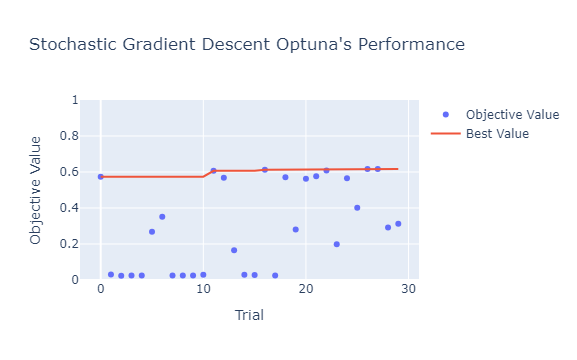

In [26]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Optuna's Performance")
fig.show()

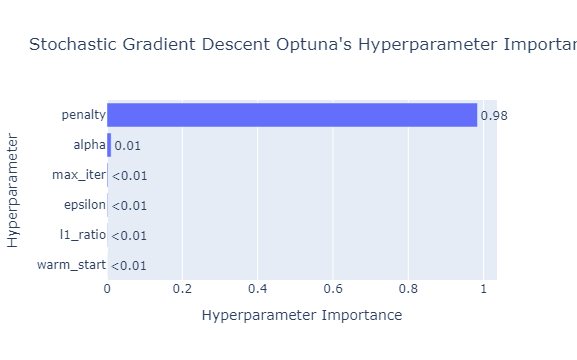

In [27]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparameter Importance")
fig.show()

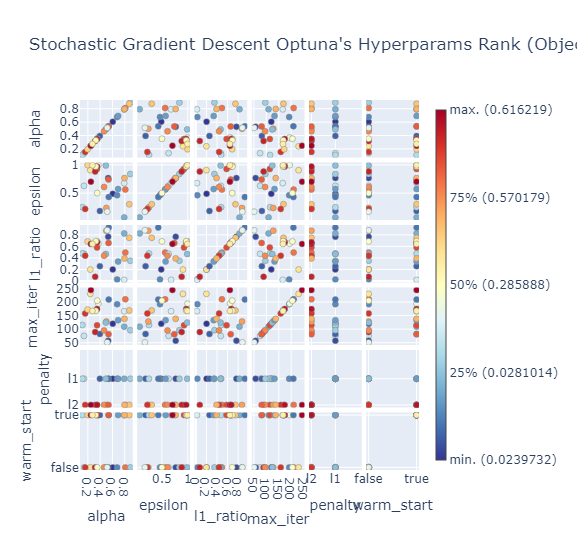

In [28]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [29]:
sgd_section = SGDClassifier(**study_sgd.best_trial.params, random_state=33)
sgd_section.fit(X_train, y_train)

SGDClassifier(alpha=0.24906495580197952, epsilon=0.7031239546032657,
              l1_ratio=0.6436922321486824, max_iter=244, random_state=33,
              warm_start=True)

In [30]:
sgd_section.score(X_test, y_test)

0.6248009906244472

In [31]:
print(classification_report(y_test, sgd_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.64      0.54      0.59       355
                            SECTION I. EXISTENCE       0.56      0.38      0.45       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.90      0.47      0.61       797
                    SECTION I. MATTER IN GENERAL       1.00      0.23      0.38       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.00      0.00      0.00       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.00      0.00      0.00       123
                     SECTION I. SPACE IN GENERAL       0.98      0.64      0.78       444
                  SECTION I. VOLITION IN GENERAL       0.62      0.43      0.51       648
                          SECTION II. DIMENSIONS       0.69      0.73      0.71      1259
                    SECTION II. INORGANIC MATTER       0.80      0.72      0.76       676
         

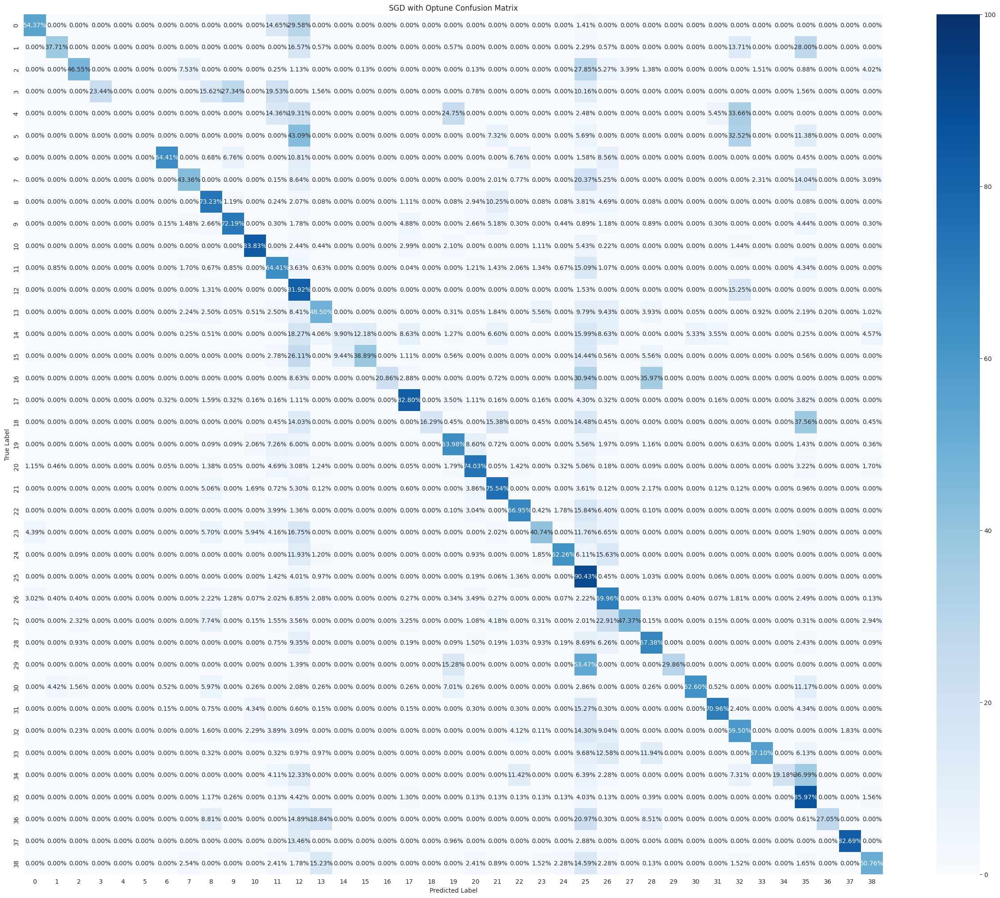

In [32]:
hf.confusion_matrix_plot(y_test, sgd_section.predict(X_test), 'SGD with Optune', 'Section/SGD_cm_optuna', figsize=(31,25))

### SVC

In [33]:
svc = SVC(max_iter=150, random_state=33)
svc.fit(X_train, y_train)

SVC(max_iter=150, random_state=33)

In [34]:
svc.score(X_test, y_test)

0.5495489120820803

In [35]:
print(classification_report(y_test, svc.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.73      0.95      0.83       355
                            SECTION I. EXISTENCE       0.65      0.85      0.74       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.77      0.83      0.80       797
                    SECTION I. MATTER IN GENERAL       0.67      0.86      0.75       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.81      0.91      0.86       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.61      0.70      0.65       123
                     SECTION I. SPACE IN GENERAL       0.89      0.94      0.91       444
                  SECTION I. VOLITION IN GENERAL       0.58      0.33      0.42       648
                          SECTION II. DIMENSIONS       0.78      0.91      0.84      1259
                    SECTION II. INORGANIC MATTER       0.66      0.92      0.77       676
         

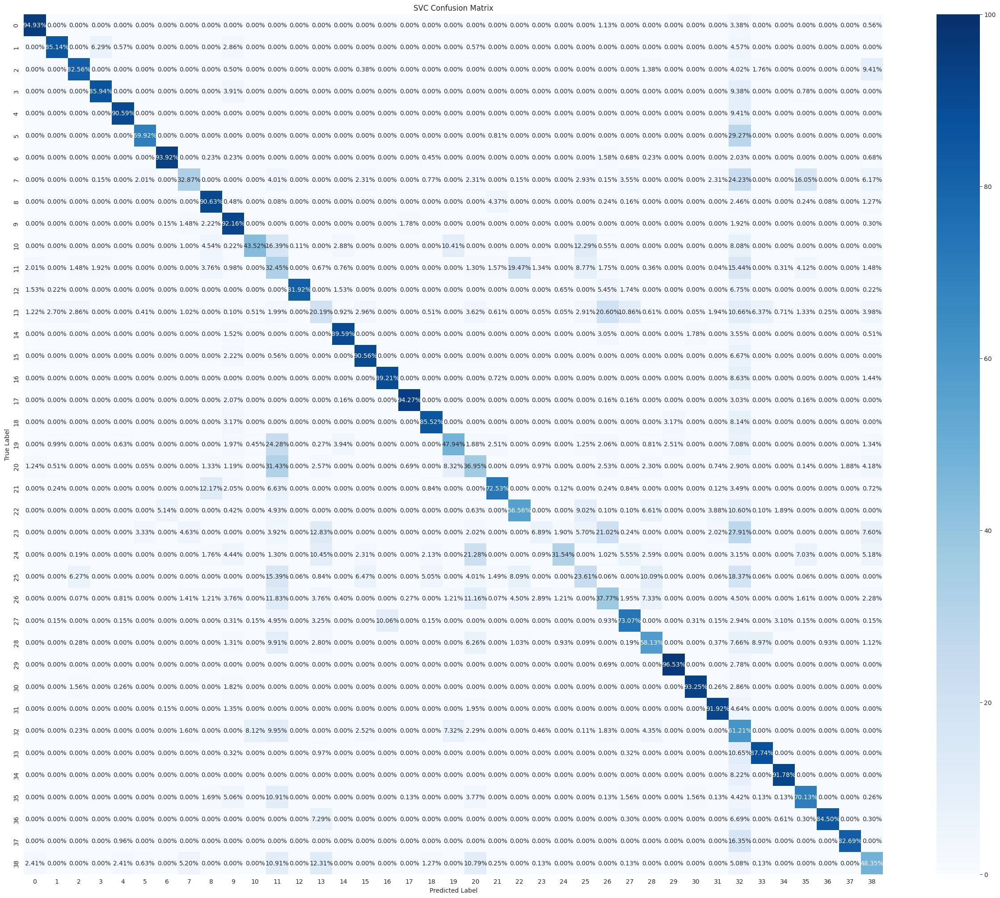

In [36]:
hf.confusion_matrix_plot(y_test, svc.predict(X_test), 'SVC', 'Section/SVC_cm', figsize=(31,25))

In [37]:
def objective_svc_section(trial):
    params = {
        'C': trial.suggest_float('C', 0.01, 1),
        'kernel': trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf']),
        'gamma': trial.suggest_categorical('gamma', ['scale', 'auto']),
        'degree': trial.suggest_int('degree', 2, 6),
        'max_iter': 150,
        'random_state': 33
    }
    
    svc = SVC(**params)

    score = cross_val_score(svc, X_train, y_train.to_numpy(), scoring='accuracy', cv=3, n_jobs=-1)
    return score.mean()

In [38]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc_section, n_trials=10, n_jobs=-1)

[I 2024-09-18 23:05:16,831] A new study created in memory with name: no-name-beb2d179-d7cc-44ee-b58d-df40f58d11b9
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing yo

In [39]:
print('Best trial:')
trial = study_svc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.7347495792203066
Params: 
  C: 0.2189174879938089
  kernel: linear
  gamma: scale
  degree: 4


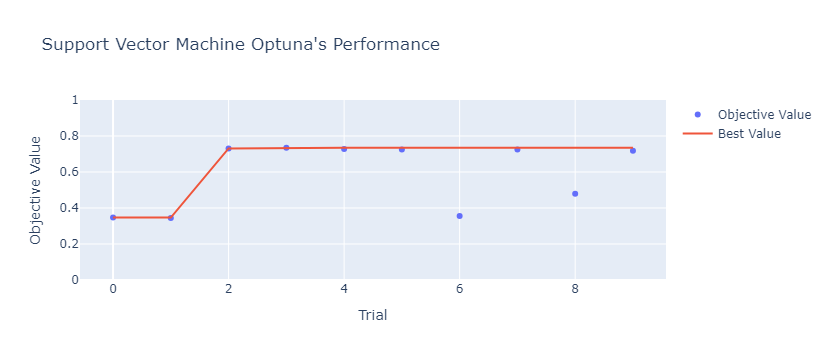

In [40]:
fig = plot_optimization_history(study_svc)
fig.update_layout(yaxis_range=[0, 1], title="Support Vector Machine Optuna's Performance")
fig.show()

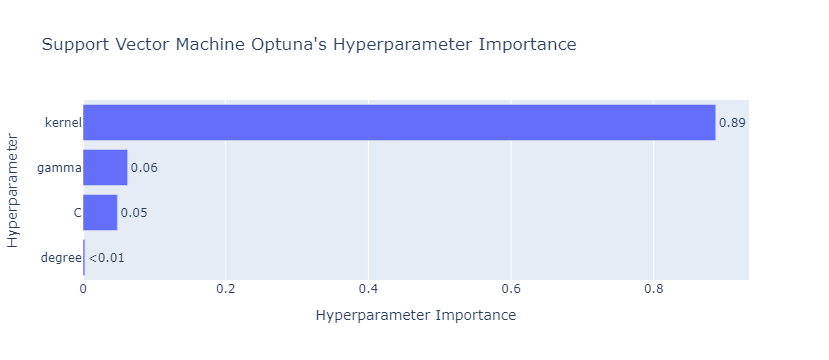

In [41]:
fig = plot_param_importances(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparameter Importance")
fig.show()

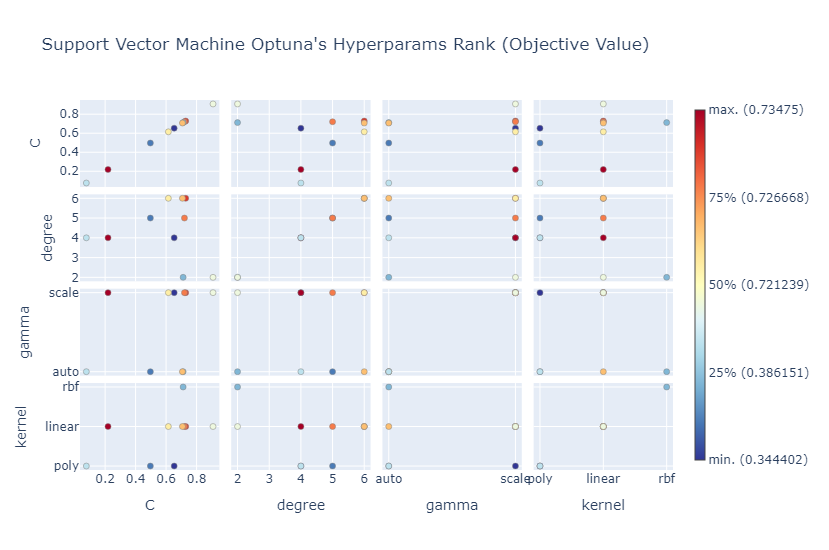

In [42]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [43]:
svc_section = SVC(**study_svc.best_trial.params, max_iter=200, random_state=33)
svc_section.fit(X_train, y_train)

SVC(C=0.2189174879938089, degree=4, kernel='linear', max_iter=200,
    random_state=33)

In [44]:
svc_section.score(X_test, y_test)

0.7530514770918096

In [45]:
print(classification_report(y_test, svc_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.63      0.97      0.77       355
                            SECTION I. EXISTENCE       0.89      0.93      0.91       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.83      0.91      0.87       797
                    SECTION I. MATTER IN GENERAL       0.65      0.86      0.74       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.77      0.97      0.86       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.62      0.75      0.68       123
                     SECTION I. SPACE IN GENERAL       0.92      0.95      0.94       444
                  SECTION I. VOLITION IN GENERAL       0.65      0.74      0.69       648
                          SECTION II. DIMENSIONS       0.79      0.88      0.83      1259
                    SECTION II. INORGANIC MATTER       0.89      0.92      0.91       676
         

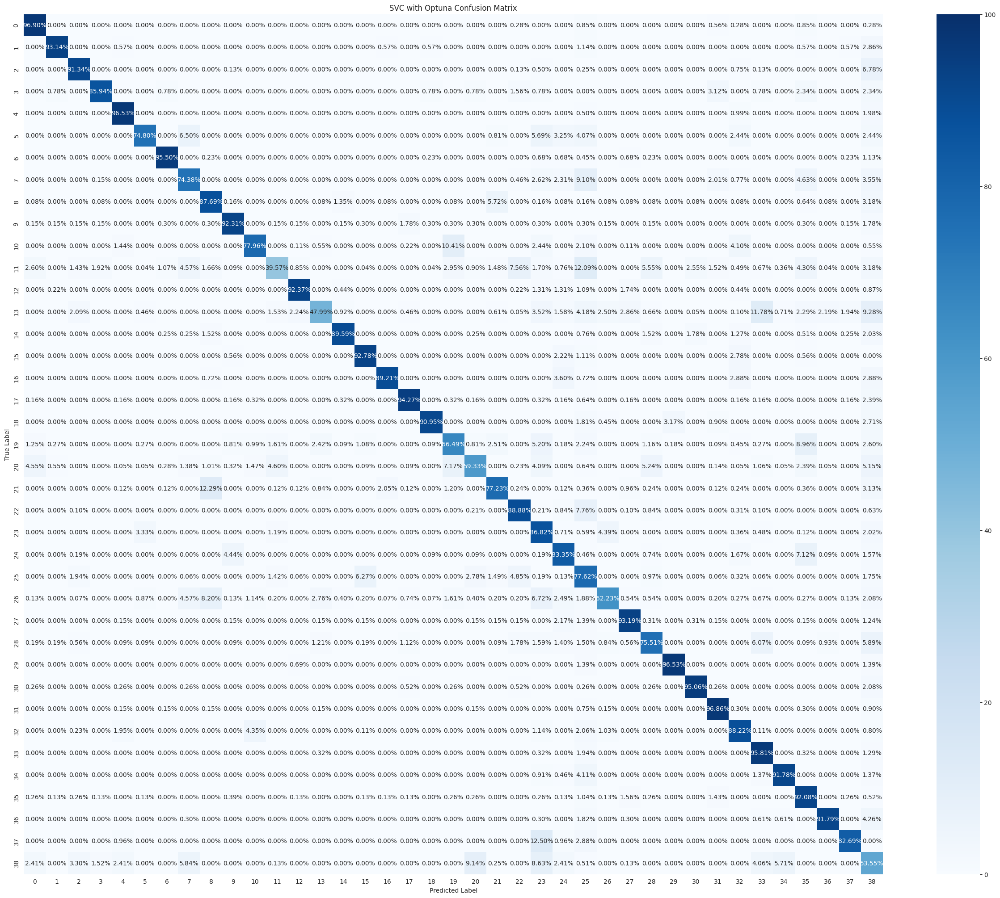

In [46]:
hf.confusion_matrix_plot(y_test, svc_section.predict(X_test), 'SVC with Optuna', 'Section/SVC_cm_optuna', figsize=(31,25))

### Random Forest

In [47]:
rf = RandomForestClassifier(random_state=33)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=33)

In [48]:
rf.score(X_test, y_test)

0.9668848399080134

In [49]:
print(classification_report(y_test, rf.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.99      0.99       355
                            SECTION I. EXISTENCE       0.99      0.94      0.96       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.98      0.98      0.98       797
                    SECTION I. MATTER IN GENERAL       0.98      0.91      0.94       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.98      0.96      0.97       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.95      0.93      0.94       123
                     SECTION I. SPACE IN GENERAL       0.99      0.98      0.99       444
                  SECTION I. VOLITION IN GENERAL       0.96      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.99      0.98      0.98      1259
                    SECTION II. INORGANIC MATTER       0.92      0.95      0.93       676
         

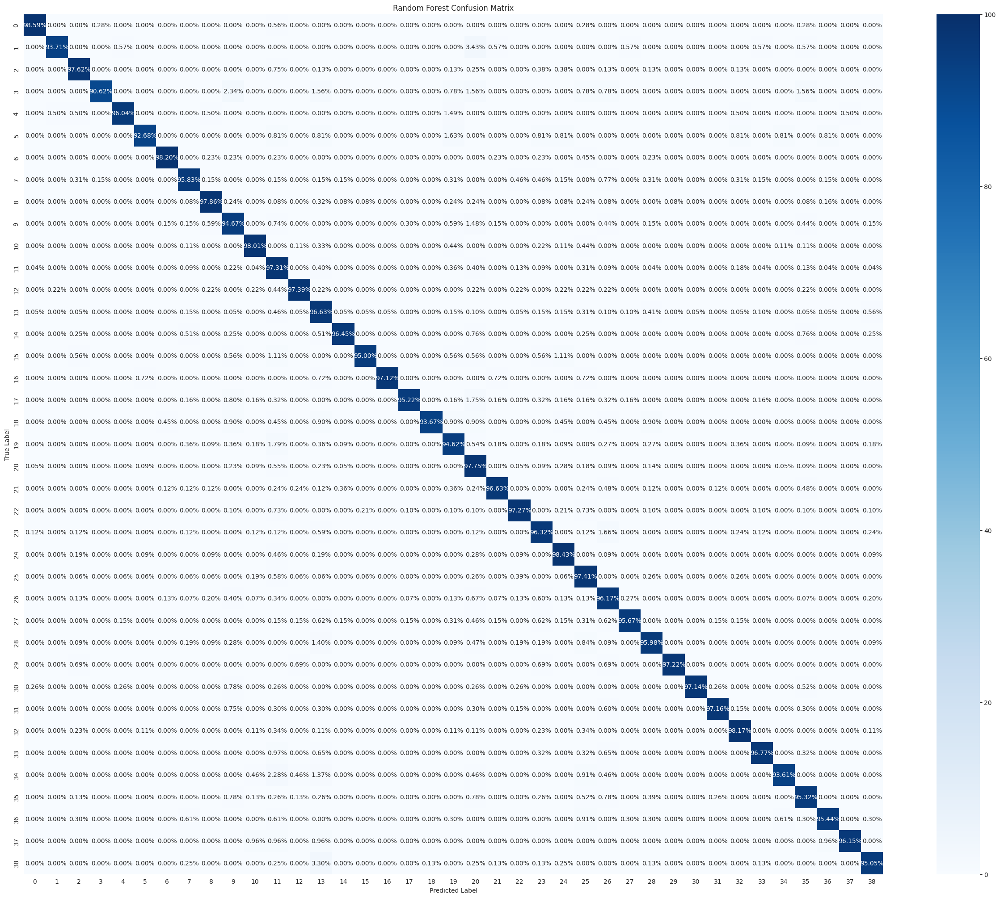

In [50]:
hf.confusion_matrix_plot(y_test, rf.predict(X_test), 'Random Forest', 'Section/RF_cm', figsize=(31,25))

In [51]:
def objective_rf_section(trial):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', low=50, high=250, step=50),
        'max_depth': trial.suggest_int('max_depth', 1, 25),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'n_jobs': -1,
        'random_state': 33
    }
    
    rfc_optuna = RandomForestClassifier(**params)

    score = cross_val_score(rfc_optuna, X_train, y_train, scoring='accuracy', cv=3, n_jobs=-1)
    return score.mean()

In [52]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf_section, n_trials=10)

[I 2024-09-18 23:20:59,929] A new study created in memory with name: no-name-06576708-e06b-42b8-9b8d-92a739537b1c
[I 2024-09-18 23:22:05,311] Trial 0 finished with value: 0.9549955268465026 and parameters: {'n_estimators': 200, 'max_depth': 24, 'min_samples_split': 4, 'min_samples_leaf': 1, 'bootstrap': False}. Best is trial 0 with value: 0.9549955268465026.
[I 2024-09-18 23:22:06,881] Trial 1 finished with value: 0.14611290542692082 and parameters: {'n_estimators': 50, 'max_depth': 1, 'min_samples_split': 5, 'min_samples_leaf': 4, 'bootstrap': True}. Best is trial 0 with value: 0.9549955268465026.
[I 2024-09-18 23:22:17,341] Trial 2 finished with value: 0.29719935101366207 and parameters: {'n_estimators': 150, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf': 4, 'bootstrap': False}. Best is trial 0 with value: 0.9549955268465026.
[I 2024-09-18 23:22:20,098] Trial 3 finished with value: 0.292392606407982 and parameters: {'n_estimators': 50, 'max_depth': 3, 'min_samples_split'

In [53]:
print('Best trial:')
trial = study_rf.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9549955268465026
Params: 
  n_estimators: 200
  max_depth: 24
  min_samples_split: 4
  min_samples_leaf: 1
  bootstrap: False


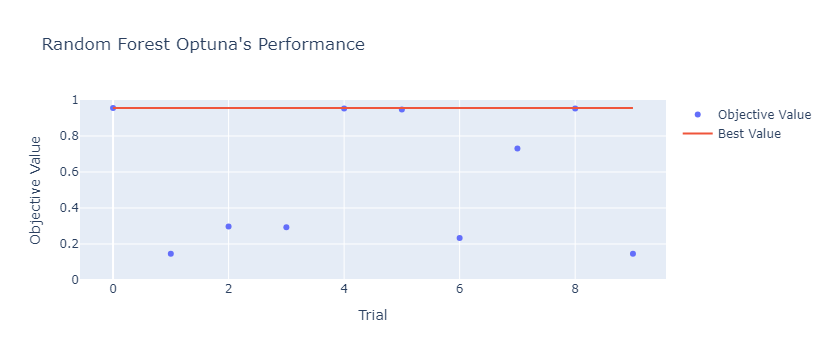

In [54]:
fig = plot_optimization_history(study_rf)
fig.update_layout(yaxis_range=[0, 1], title="Random Forest Optuna's Performance")
fig.show()

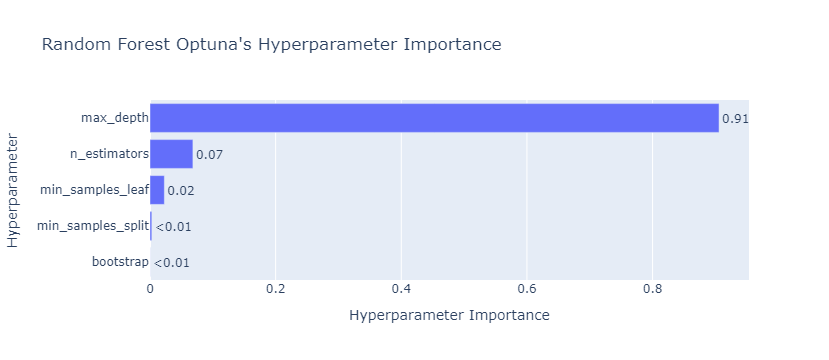

In [55]:
fig = plot_param_importances(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparameter Importance")
fig.show()

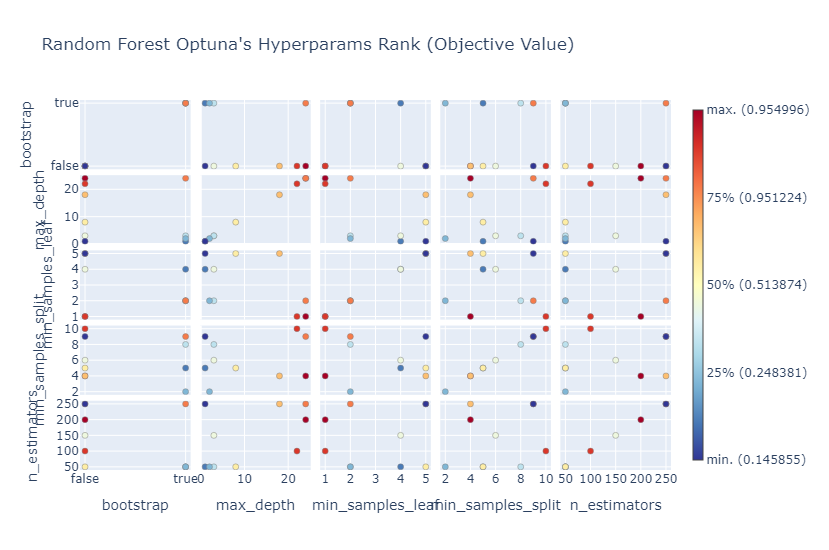

In [56]:
fig = plot_rank(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [57]:
rf_section = RandomForestClassifier(**study_rf.best_trial.params, random_state=33, n_jobs=-1)
rf_section.fit(X_train, y_train)

RandomForestClassifier(bootstrap=False, max_depth=24, min_samples_split=4,
                       n_estimators=200, n_jobs=-1, random_state=33)

In [58]:
rf_section.score(X_test, y_test)

0.9577923226605343

In [59]:
print(classification_report(y_test, rf_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.98      0.99       355
                            SECTION I. EXISTENCE       0.99      0.91      0.95       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.96      0.98       797
                    SECTION I. MATTER IN GENERAL       0.99      0.86      0.92       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.98      0.96      0.97       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.97      0.81      0.88       123
                     SECTION I. SPACE IN GENERAL       1.00      0.96      0.98       444
                  SECTION I. VOLITION IN GENERAL       0.99      0.94      0.96       648
                          SECTION II. DIMENSIONS       1.00      0.97      0.98      1259
                    SECTION II. INORGANIC MATTER       0.93      0.96      0.94       676
         

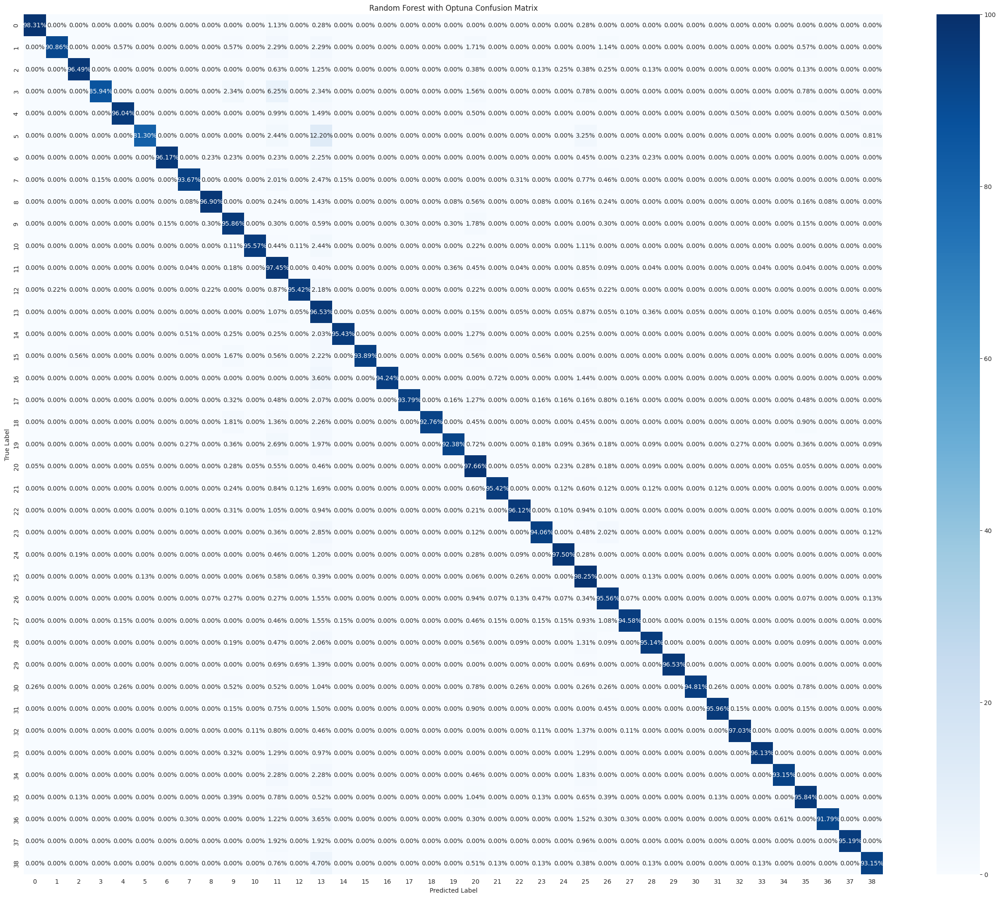

In [60]:
hf.confusion_matrix_plot(y_test, rf_section.predict(X_test), 'Random Forest with Optuna', 'Section/RF_cm_optuna', figsize=(31,25))

### AdaBoost

In [61]:
adaboost = AdaBoostClassifier(random_state=33)
adaboost.fit(X_train, y_train)

AdaBoostClassifier(random_state=33)

In [62]:
adaboost.score(X_test, y_test)

0.2287281089686892

In [63]:
print(classification_report(y_test, adaboost.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.23      0.05      0.08       355
                            SECTION I. EXISTENCE       0.27      0.06      0.10       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.65      0.30      0.42       797
                    SECTION I. MATTER IN GENERAL       0.25      0.02      0.04       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.19      0.05      0.08       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.00      0.00      0.00       123
                     SECTION I. SPACE IN GENERAL       0.45      0.31      0.37       444
                  SECTION I. VOLITION IN GENERAL       0.17      0.02      0.04       648
                          SECTION II. DIMENSIONS       0.37      0.44      0.40      1259
                    SECTION II. INORGANIC MATTER       0.12      0.07      0.08       676
         

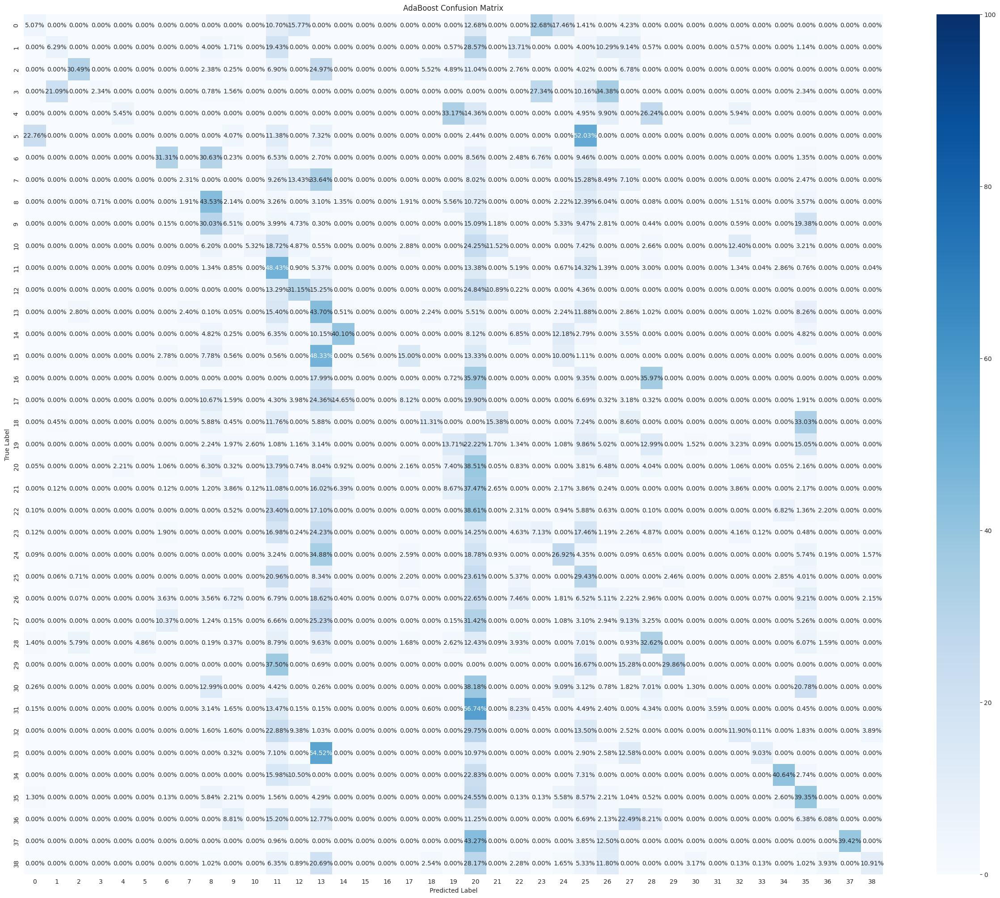

In [64]:
hf.confusion_matrix_plot(y_test, adaboost.predict(X_test), 'AdaBoost', 'Section/AdaBoost_cm', figsize=(31,25))

In [65]:
def objective_ada_section(trial):
    params_estimator = {
        'max_depth': trial.suggest_int('max_depth', 1, 15),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 15),
        'max_features': trial.suggest_int('max_features', 20, 50),
        'random_state': 33        
    }
    estimator = DecisionTreeClassifier(**params_estimator)
    
    params = {
        'estimator': estimator,
        'n_estimators': trial.suggest_int('n_estimators', 50, 150, step=25),
        'algorithm': 'SAMME',
        # 'learning_rate': trial.suggest_float('learning_rate', .01, .05),
        'random_state': 33
    }
    adaboost = AdaBoostClassifier(**params)
    
    score = cross_val_score(adaboost,
                            X_train,
                            y_train,
                            scoring='accuracy',
                            cv=3,
                            n_jobs=-1)

    return score.mean()

In [66]:
study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_ada_section, n_trials=10)

[I 2024-09-18 23:30:15,035] A new study created in memory with name: no-name-246ac270-9806-4c2e-a53e-d9049302b97f
[I 2024-09-18 23:32:57,493] Trial 0 finished with value: 0.845698949188009 and parameters: {'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 9, 'max_features': 40, 'n_estimators': 100}. Best is trial 0 with value: 0.845698949188009.
[I 2024-09-18 23:33:14,034] Trial 1 finished with value: 0.1783499370725864 and parameters: {'max_depth': 2, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': 22, 'n_estimators': 50}. Best is trial 0 with value: 0.845698949188009.
[I 2024-09-18 23:38:41,741] Trial 2 finished with value: 0.9625619797115953 and parameters: {'max_depth': 13, 'min_samples_split': 2, 'min_samples_leaf': 14, 'max_features': 37, 'n_estimators': 150}. Best is trial 2 with value: 0.9625619797115953.
[I 2024-09-18 23:39:15,090] Trial 3 finished with value: 0.2261596081820801 and parameters: {'max_depth': 2, 'min_samples_split': 2, 'min_samples_leaf

In [67]:
print('Best trial:')
trial = study_adaboost.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9638356912159396
Params: 
  max_depth: 14
  min_samples_split: 2
  min_samples_leaf: 14
  max_features: 47
  n_estimators: 150


In [68]:
trials_df = study_adaboost.trials_dataframe()
trials_df.sort_values(by='value', ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_n_estimators,state
5,5,0.963836,2024-09-18 23:44:22.685703,2024-09-18 23:51:29.574338,0 days 00:07:06.888635,14,47,14,2,150,COMPLETE
2,2,0.962562,2024-09-18 23:33:14.035318,2024-09-18 23:38:41.741739,0 days 00:05:27.706421,13,37,14,2,150,COMPLETE
7,7,0.961743,2024-09-18 23:52:43.008220,2024-09-18 23:54:47.277452,0 days 00:02:04.269232,13,27,11,2,75,COMPLETE
4,4,0.941697,2024-09-18 23:39:15.091723,2024-09-18 23:44:22.684784,0 days 00:05:07.593061,8,46,8,2,150,COMPLETE
0,0,0.845699,2024-09-18 23:30:15.036835,2024-09-18 23:32:57.492849,0 days 00:02:42.456014,7,40,9,3,100,COMPLETE
9,9,0.790080,2024-09-18 23:55:14.804906,2024-09-18 23:57:09.848160,0 days 00:01:55.043254,7,35,10,3,75,COMPLETE
6,6,0.230466,2024-09-18 23:51:29.575443,2024-09-18 23:52:43.006844,0 days 00:01:13.431401,2,45,1,4,125,COMPLETE
3,3,0.226160,2024-09-18 23:38:41.742729,2024-09-18 23:39:15.090633,0 days 00:00:33.347904,2,24,11,2,100,COMPLETE
8,8,0.210360,2024-09-18 23:54:47.278618,2024-09-18 23:55:14.804062,0 days 00:00:27.525444,2,27,12,4,75,COMPLETE
1,1,0.178350,2024-09-18 23:32:57.493811,2024-09-18 23:33:14.034458,0 days 00:00:16.540647,2,22,7,4,50,COMPLETE


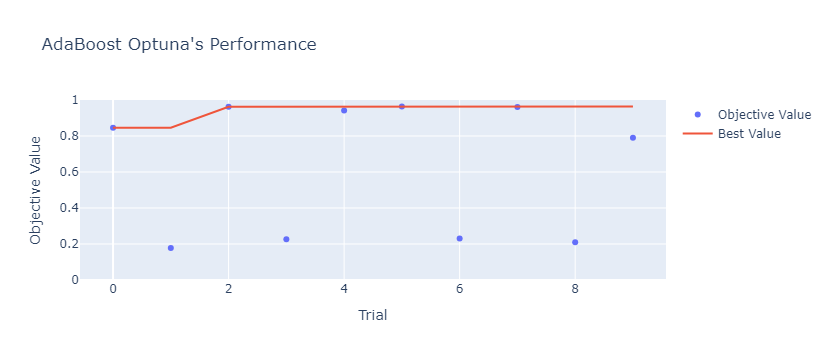

In [69]:
fig = plot_optimization_history(study_adaboost)
fig.update_layout(yaxis_range=[0, 1], title="AdaBoost Optuna's Performance")
fig.show()

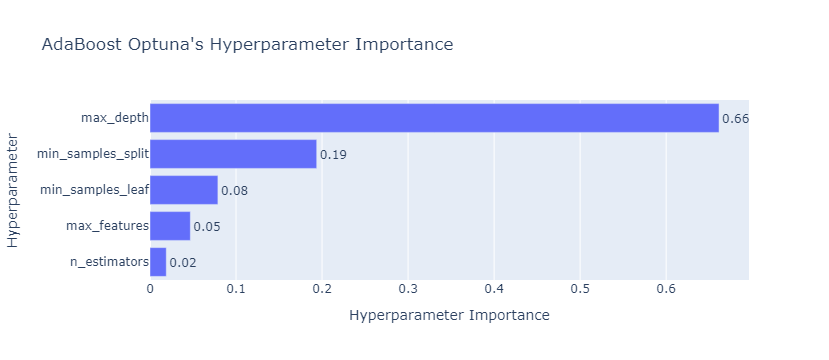

In [70]:
fig = plot_param_importances(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparameter Importance")
fig.show()

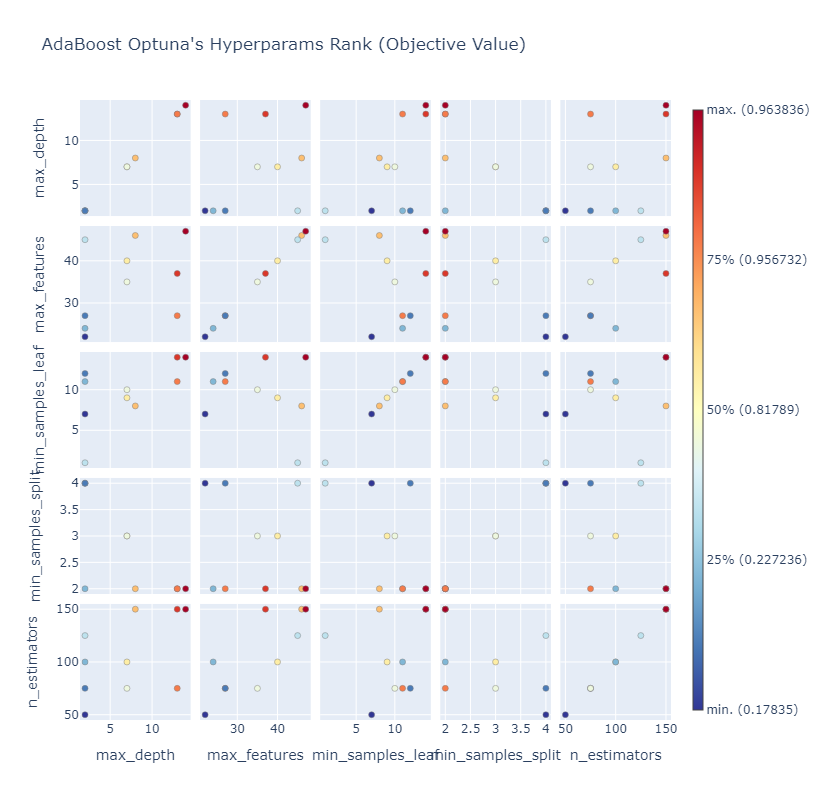

In [72]:
fig = plot_rank(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparams Rank (Objective Value)", height=800)
fig.show()

In [73]:
params_estimator = {
        'max_depth': None,
        'min_samples_split': None,
        'min_samples_leaf': None,
        'max_features': None,
        'random_state': 33        
}

params = {
    'estimator': None,
    'n_estimators': None,
    'algorithm': 'SAMME',
    'random_state': 33
}
for i, key in enumerate(trial.params.items()):
    if i < 4:
        params_estimator[key[0]] = key[1]
    else:
        params[key[0]] = key[1]

In [75]:
estimator = DecisionTreeClassifier(**params_estimator)
params['estimator'] = estimator

adaboost_section = AdaBoostClassifier(**params)
adaboost_section.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=14,
                                                    max_features=47,
                                                    min_samples_leaf=14,
                                                    random_state=33),
                   n_estimators=150, random_state=33)

In [76]:
adaboost_section.score(X_test, y_test)

0.9656465593490182

In [77]:
print(classification_report(y_test, adaboost_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.99      0.99       355
                            SECTION I. EXISTENCE       0.99      0.94      0.96       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.97      0.98       797
                    SECTION I. MATTER IN GENERAL       0.99      0.91      0.95       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.97      0.97      0.97       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.98      0.89      0.94       123
                     SECTION I. SPACE IN GENERAL       1.00      0.98      0.99       444
                  SECTION I. VOLITION IN GENERAL       0.94      0.95      0.95       648
                          SECTION II. DIMENSIONS       0.99      0.98      0.98      1259
                    SECTION II. INORGANIC MATTER       0.96      0.94      0.95       676
         

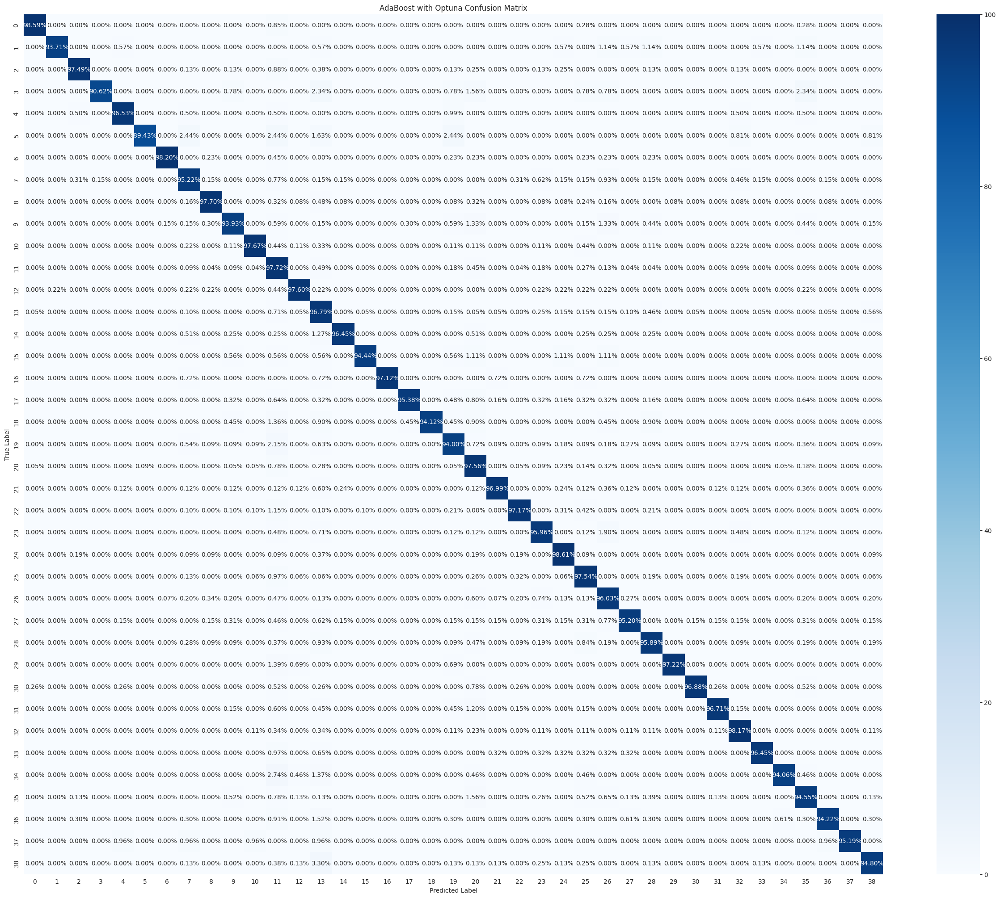

In [78]:
hf.confusion_matrix_plot(y_test, adaboost_section.predict(X_test), 'AdaBoost with Optuna', 'Section/AdaBoost_cm_optuna', figsize=(31,25))

### Extra Trees

In [79]:
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

ExtraTreesClassifier()

In [80]:
etc.score(X_test, y_test)

0.9676631876879533

In [81]:
print(classification_report(y_test, etc.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.99      0.99       355
                            SECTION I. EXISTENCE       0.98      0.94      0.96       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.98      0.98      0.98       797
                    SECTION I. MATTER IN GENERAL       0.99      0.91      0.95       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.97      0.96      0.96       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.93      0.93      0.93       123
                     SECTION I. SPACE IN GENERAL       0.99      0.98      0.99       444
                  SECTION I. VOLITION IN GENERAL       0.96      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.98      0.98      0.98      1259
                    SECTION II. INORGANIC MATTER       0.92      0.96      0.94       676
         

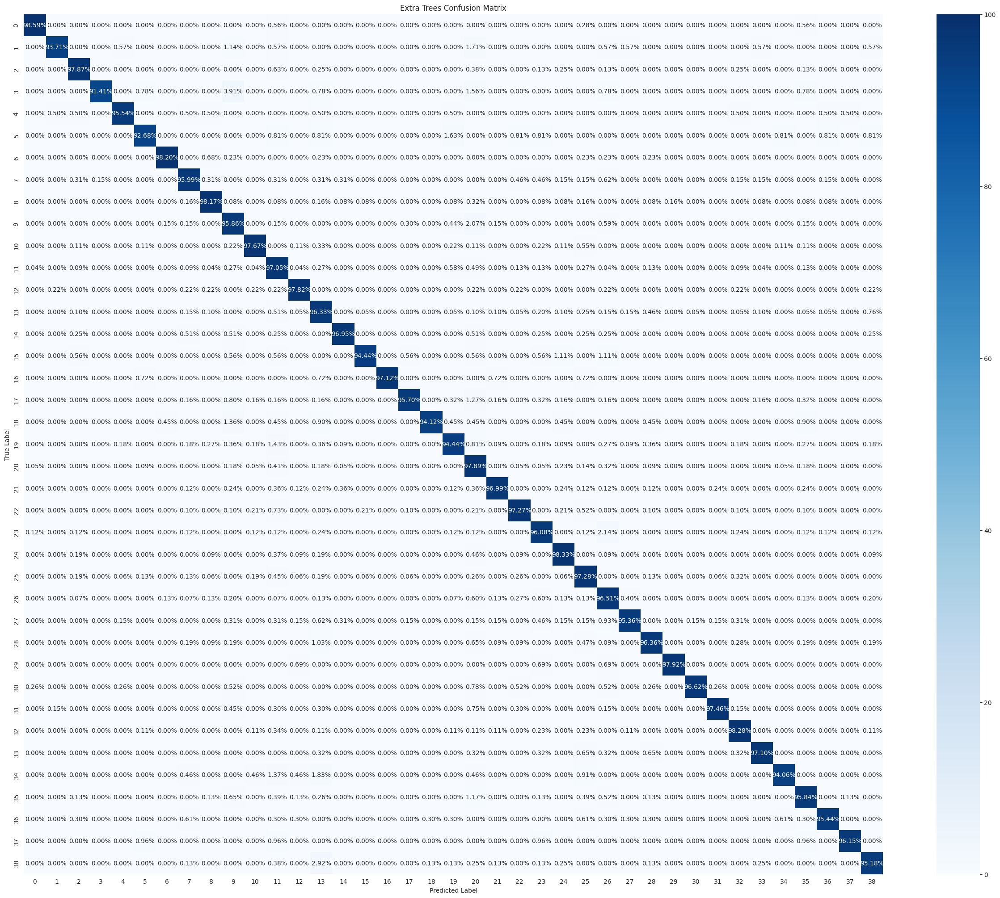

In [82]:
hf.confusion_matrix_plot(y_test, etc.predict(X_test), 'Extra Trees', 'Section/ExtraTrees_cm', figsize=(31,25))

In [83]:
def objective_etc_section(trial):
    max_depth_categ = np.linspace(5, 20, 10).astype(int).tolist()
    max_depth_categ.append(None)

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 125, step=25),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_categorical('max_depth', max_depth_categ),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
    }
    etc_optuna = ExtraTreesClassifier(**params)

    score = cross_val_score(etc_optuna, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [84]:
study_etc = optuna.create_study(direction='maximize')
study_etc.optimize(objective_etc_section, n_trials=10)

[I 2024-09-19 00:12:53,961] A new study created in memory with name: no-name-0efdcdb9-cea0-4753-a50b-a8d10164e525
[I 2024-09-19 00:13:00,052] Trial 0 finished with value: 0.8890051403357139 and parameters: {'n_estimators': 125, 'criterion': 'gini', 'max_depth': 18, 'min_samples_split': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.8890051403357139.
[I 2024-09-19 00:13:02,937] Trial 1 finished with value: 0.7225735037680631 and parameters: {'n_estimators': 50, 'criterion': 'gini', 'max_depth': 11, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8890051403357139.
[I 2024-09-19 00:13:05,382] Trial 2 finished with value: 0.907110039576036 and parameters: {'n_estimators': 50, 'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 3, 'max_features': 'log2'}. Best is trial 2 with value: 0.907110039576036.
[I 2024-09-19 00:13:09,012] Trial 3 finished with value: 0.45921848701269163 and parameters: {'n_estimators': 125, 'criterion': 'log_loss', 'ma

In [85]:
print('Best trial:')
trial = study_etc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9607727183126356
Params: 
  n_estimators: 125
  criterion: entropy
  max_depth: 20
  min_samples_split: 4
  max_features: sqrt


In [86]:
trials_df = study_etc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_criterion,params_max_depth,params_max_features,params_min_samples_split,params_n_estimators,state
8,8,0.960773,2024-09-19 00:13:24.113968,2024-09-19 00:13:31.986685,0 days 00:00:07.872717,entropy,20,sqrt,4,125,COMPLETE
6,6,0.952903,2024-09-19 00:13:14.824491,2024-09-19 00:13:20.764183,0 days 00:00:05.939692,log_loss,16,sqrt,4,100,COMPLETE
9,9,0.951190,2024-09-19 00:13:31.987448,2024-09-19 00:13:34.906449,0 days 00:00:02.919001,log_loss,16,sqrt,4,50,COMPLETE
4,4,0.947277,2024-09-19 00:13:09.013600,2024-09-19 00:13:12.568839,0 days 00:00:03.555239,entropy,15,sqrt,2,50,COMPLETE
2,2,0.907110,2024-09-19 00:13:02.937848,2024-09-19 00:13:05.382013,0 days 00:00:02.444165,gini,20,log2,3,50,COMPLETE


In [87]:
fig = plot_optimization_history(study_etc)
fig.update_layout(yaxis_range=[0, 1], title="Extra Tree Optuna's Performance", width=930, height=550)
fig.show()

In [88]:
fig = plot_rank(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [89]:
etc_section = ExtraTreesClassifier(**study_etc.best_trial.params)
etc_section.fit(X_train, y_train)

ExtraTreesClassifier(criterion='entropy', max_depth=20, min_samples_split=4,
                     n_estimators=125)

In [90]:
etc_section.score(X_test, y_test)

0.9623208915620025

In [91]:
print(classification_report(y_test, etc_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.99      0.99       355
                            SECTION I. EXISTENCE       0.99      0.93      0.96       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.97      0.98       797
                    SECTION I. MATTER IN GENERAL       0.99      0.89      0.94       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.98      0.96      0.97       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.97      0.88      0.92       123
                     SECTION I. SPACE IN GENERAL       1.00      0.97      0.98       444
                  SECTION I. VOLITION IN GENERAL       0.98      0.95      0.96       648
                          SECTION II. DIMENSIONS       0.98      0.97      0.98      1259
                    SECTION II. INORGANIC MATTER       0.94      0.95      0.94       676
         

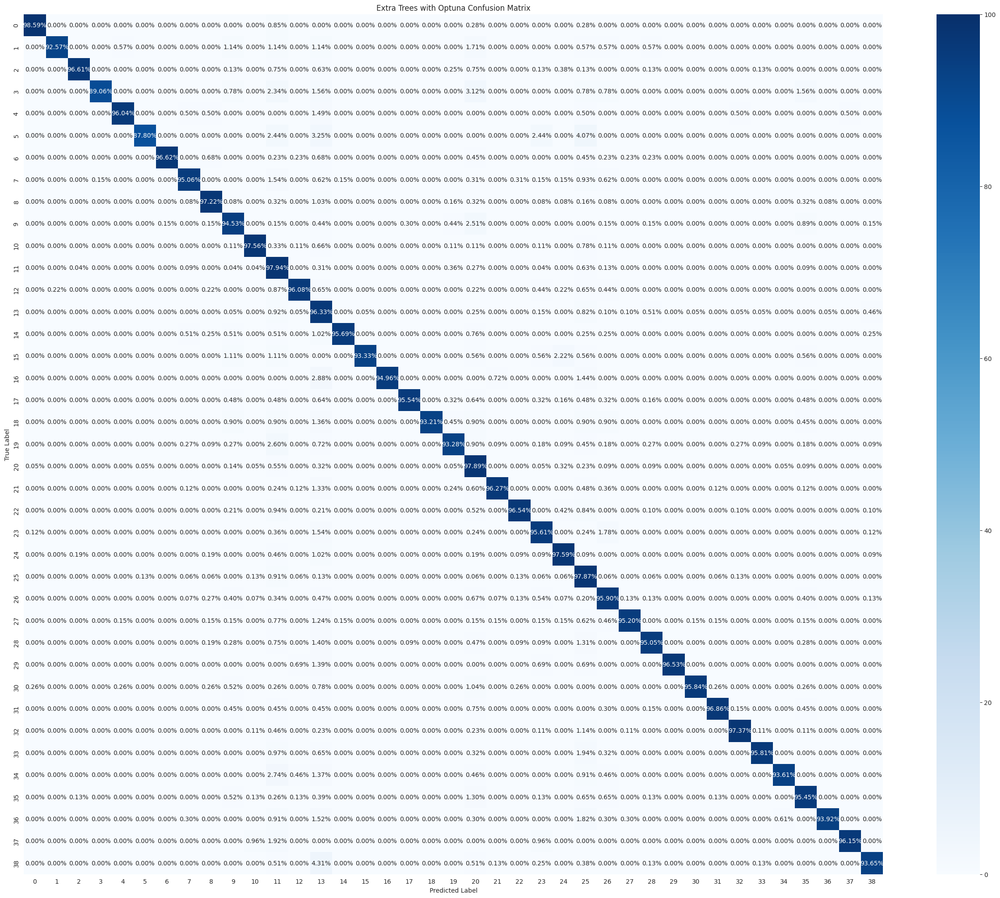

In [92]:
hf.confusion_matrix_plot(y_test, etc_section.predict(X_test), 'Extra Trees with Optuna', 'Section/ExtraTrees_cm_optuna', figsize=(31,25))

### XGBoost

In [93]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to numeric labels
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)

In [94]:
xgboost = XGBClassifier(use_label_encoder=False, n_jobs=-1, random_state=33)
xgboost.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [95]:
xgboost.score(X_test, y_test_encoded)

0.9656465593490182

In [96]:
print(classification_report(y_test_encoded, xgboost.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       355
           1       0.97      0.96      0.97       175
           2       0.98      0.98      0.98       797
           3       0.99      0.91      0.95       128
           4       0.97      0.97      0.97       202
           5       0.91      0.93      0.92       123
           6       0.99      0.98      0.99       444
           7       0.97      0.95      0.96       648
           8       0.98      0.98      0.98      1259
           9       0.96      0.94      0.95       676
          10       0.99      0.98      0.98       903
          11       0.95      0.97      0.96      2234
          12       0.98      0.98      0.98       459
          13       0.94      0.97      0.95      1961
          14       0.97      0.96      0.97       394
          15       0.96      0.95      0.96       180
          16       1.00      0.96      0.98       139
          17       0.98    

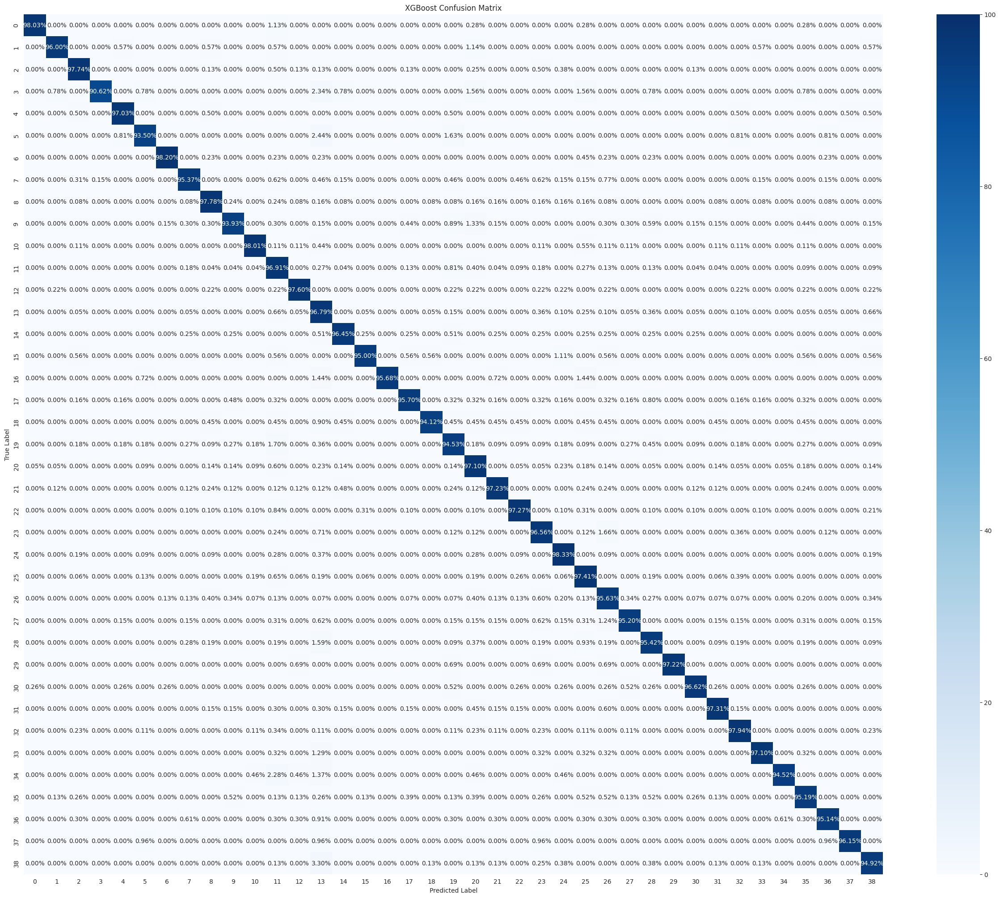

In [97]:
hf.confusion_matrix_plot(y_test_encoded, xgboost.predict(X_test), 'XGBoost', 'Section/XGBoost_cm', figsize=(31,25))

In [98]:
def objective_xgb_section(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.1, 10),
        'subsample': trial.suggest_float('subsample', 0.3, 0.6),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'lambda': trial.suggest_float('lambda', 0, 10),
        'alpha': trial.suggest_float('alpha', 0, 10),
        'objective': 'multi:softmax',
        'num_class': 6,
        'eval_metric': 'mlogloss',
    }
    
    xgboost = XGBClassifier(**params, n_jobs=-1, random_state=33)
    score = cross_val_score(xgboost, X_train, y_train_encoded, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [99]:
study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb_section, n_trials=10)

[I 2024-09-19 00:16:18,100] A new study created in memory with name: no-name-a131366f-1ed8-4df9-ae0a-87aabbfb80cd
[I 2024-09-19 00:18:23,480] Trial 0 finished with value: 0.9372090554822666 and parameters: {'n_estimators': 150, 'max_depth': 6, 'learning_rate': 0.04839959380569927, 'min_child_weight': 5, 'gamma': 9.648602702043053, 'subsample': 0.4954916442351658, 'colsample_bytree': 0.96426039590996, 'lambda': 1.7824323503811434, 'alpha': 4.575045608373277}. Best is trial 0 with value: 0.9372090554822666.
[I 2024-09-19 00:23:16,276] Trial 1 finished with value: 0.9533730610016832 and parameters: {'n_estimators': 250, 'max_depth': 9, 'learning_rate': 0.028632797654208293, 'min_child_weight': 1, 'gamma': 1.79760557806524, 'subsample': 0.47517198152264917, 'colsample_bytree': 0.7573049275535092, 'lambda': 1.7052716507782517, 'alpha': 4.707825046195491}. Best is trial 1 with value: 0.9533730610016832.
[I 2024-09-19 00:26:54,440] Trial 2 finished with value: 0.9554049341157561 and parameter

In [100]:
print('Best trial:')
trial = study_xgb.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9554049341157561
Params: 
  n_estimators: 200
  max_depth: 6
  learning_rate: 0.03424061310791412
  min_child_weight: 4
  gamma: 3.179070937210195
  subsample: 0.5936840359534029
  colsample_bytree: 0.828582580467322
  lambda: 2.8845806685857434
  alpha: 0.08185763575301652


In [101]:
trials_df = study_xgb.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
2,2,0.955405,2024-09-19 00:23:16.276832,2024-09-19 00:26:54.440386,0 days 00:03:38.163554,0.081858,0.828583,3.179071,2.884581,0.034241,6,4,200,0.593684,COMPLETE
1,1,0.953373,2024-09-19 00:18:23.481443,2024-09-19 00:23:16.275797,0 days 00:04:52.794354,4.707825,0.757305,1.797606,1.705272,0.028633,9,1,250,0.475172,COMPLETE
0,0,0.937209,2024-09-19 00:16:18.101821,2024-09-19 00:18:23.479771,0 days 00:02:05.377950,4.575046,0.964260,9.648603,1.782432,0.048400,6,5,150,0.495492,COMPLETE
9,9,0.935010,2024-09-19 00:39:39.188457,2024-09-19 00:42:10.236157,0 days 00:02:31.047700,4.846155,0.642723,8.020030,4.036584,0.039118,5,2,200,0.418602,COMPLETE
3,3,0.933888,2024-09-19 00:26:54.442375,2024-09-19 00:28:29.784849,0 days 00:01:35.342474,3.563583,0.687133,7.591330,2.449867,0.037937,10,4,100,0.337470,COMPLETE


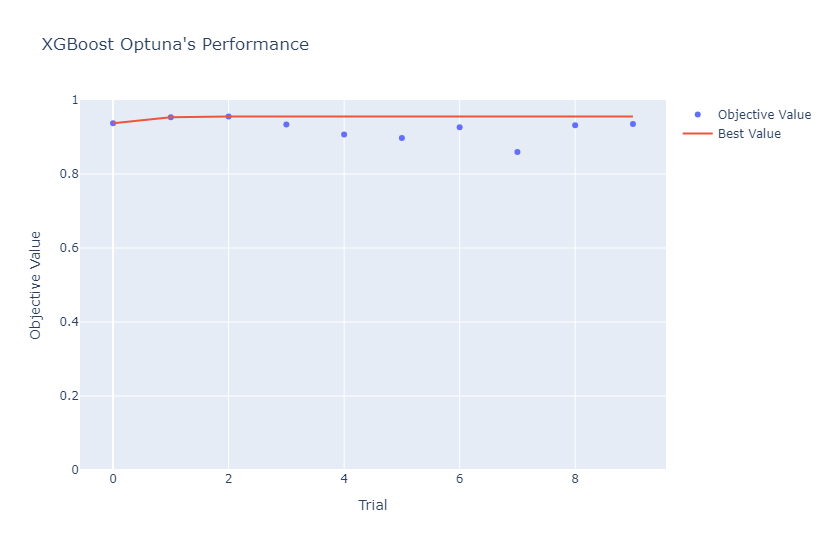

In [102]:
fig = plot_optimization_history(study_xgb)
fig.update_layout(yaxis_range=[0, 1], title="XGBoost Optuna's Performance", width=930, height=550)
fig.show()

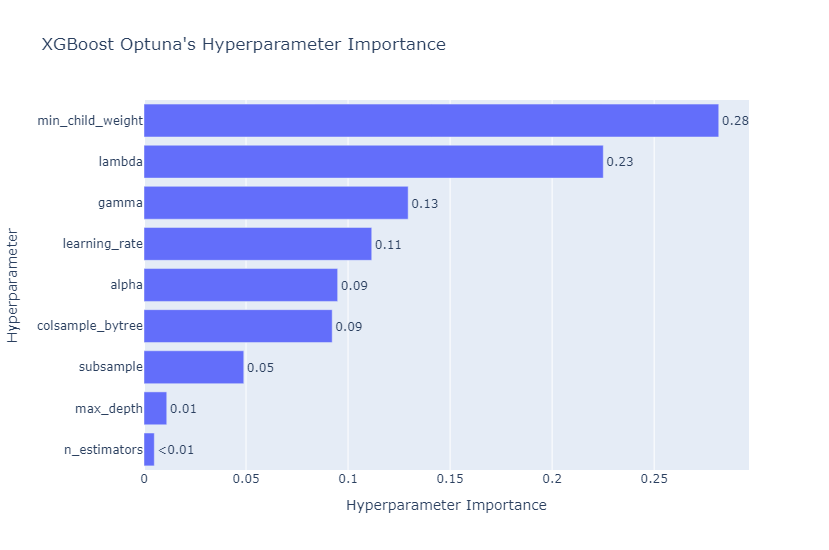

In [103]:
fig = plot_param_importances(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

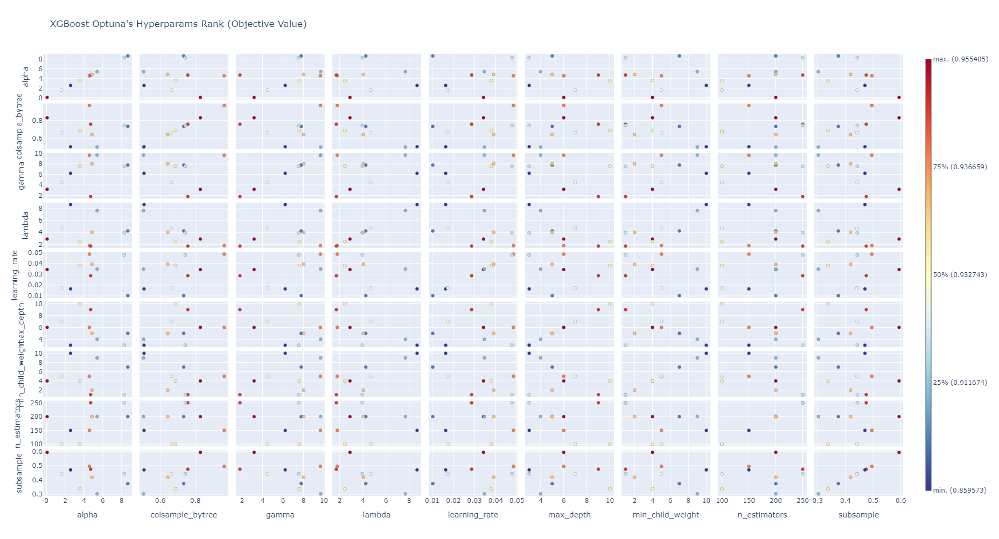

In [109]:
fig = plot_rank(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparams Rank (Objective Value)", width=1330, height=1000)
fig.show()

In [110]:
xgboost_section = XGBClassifier(**study_xgb.best_trial.params, n_jobs=-1, random_state=33)
xgboost_section.fit(X_train, y_train_encoded)

XGBClassifier(alpha=0.08185763575301652, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.828582580467322, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=3.179070937210195,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=2.8845806685857434,
              learning_rate=0.03424061310791412, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=-1, ...)

In [111]:
xgboost_section.score(X_test, y_test_encoded)

0.9604104015566955

In [112]:
print(classification_report(y_test_encoded, xgboost_section.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       355
           1       0.98      0.95      0.96       175
           2       0.98      0.97      0.98       797
           3       0.98      0.87      0.92       128
           4       0.98      0.97      0.97       202
           5       0.93      0.92      0.92       123
           6       1.00      0.96      0.98       444
           7       0.95      0.95      0.95       648
           8       0.97      0.97      0.97      1259
           9       0.95      0.95      0.95       676
          10       0.99      0.97      0.98       903
          11       0.92      0.98      0.95      2234
          12       0.97      0.96      0.97       459
          13       0.92      0.96      0.94      1961
          14       1.00      0.95      0.97       394
          15       1.00      0.94      0.97       180
          16       1.00      0.95      0.97       139
          17       0.98    

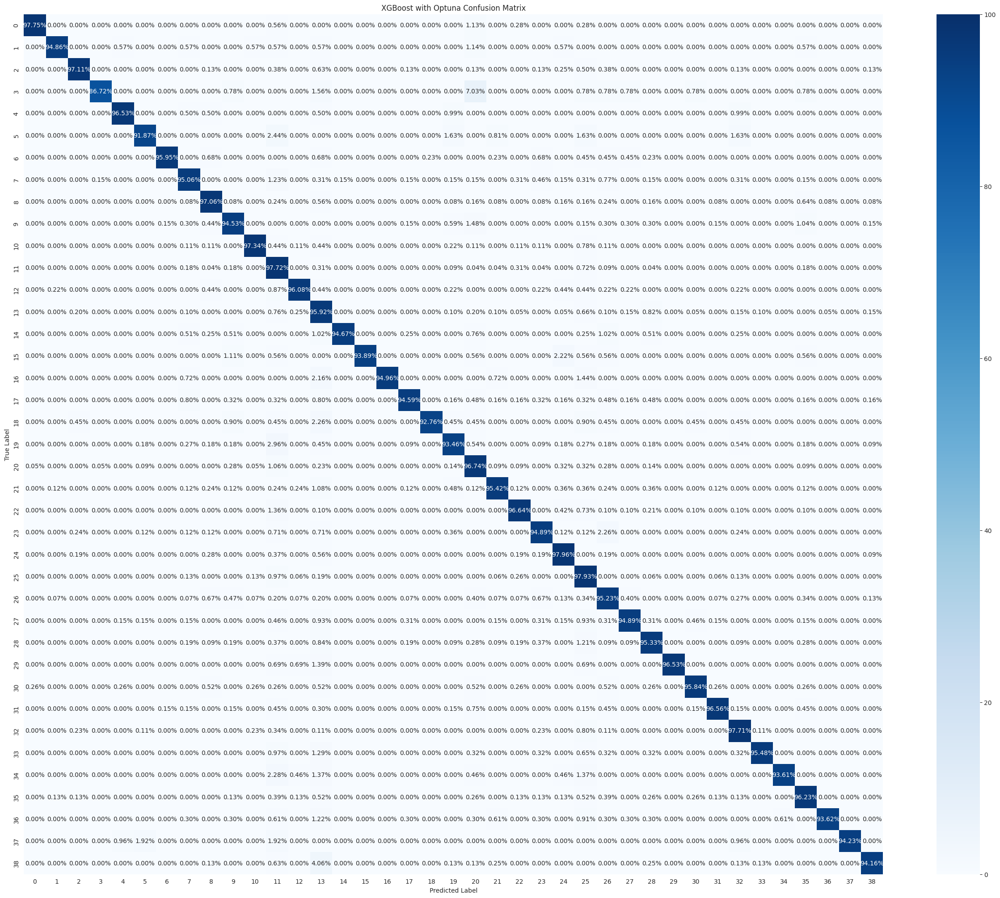

In [113]:
hf.confusion_matrix_plot(y_test_encoded, xgboost_section.predict(X_test), 'XGBoost with Optuna', 'Section/XGBoost_cm_optuna', figsize=(31,25))

### LightGBM

In [114]:
lgbm = LGBMClassifier(verbose=-1)
lgbm.fit(X_train, y_train)

LGBMClassifier(verbose=-1)

In [115]:
lgbm.score(X_test, y_test)

0.9662833893507872

In [116]:
print(classification_report(y_test, lgbm.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.98      0.99       355
                            SECTION I. EXISTENCE       0.93      0.96      0.94       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.97      0.98       797
                    SECTION I. MATTER IN GENERAL       0.96      0.91      0.94       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.96      0.96      0.96       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.92      0.89      0.90       123
                     SECTION I. SPACE IN GENERAL       0.99      0.98      0.99       444
                  SECTION I. VOLITION IN GENERAL       0.97      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.99      0.98      0.98      1259
                    SECTION II. INORGANIC MATTER       0.97      0.95      0.96       676
         

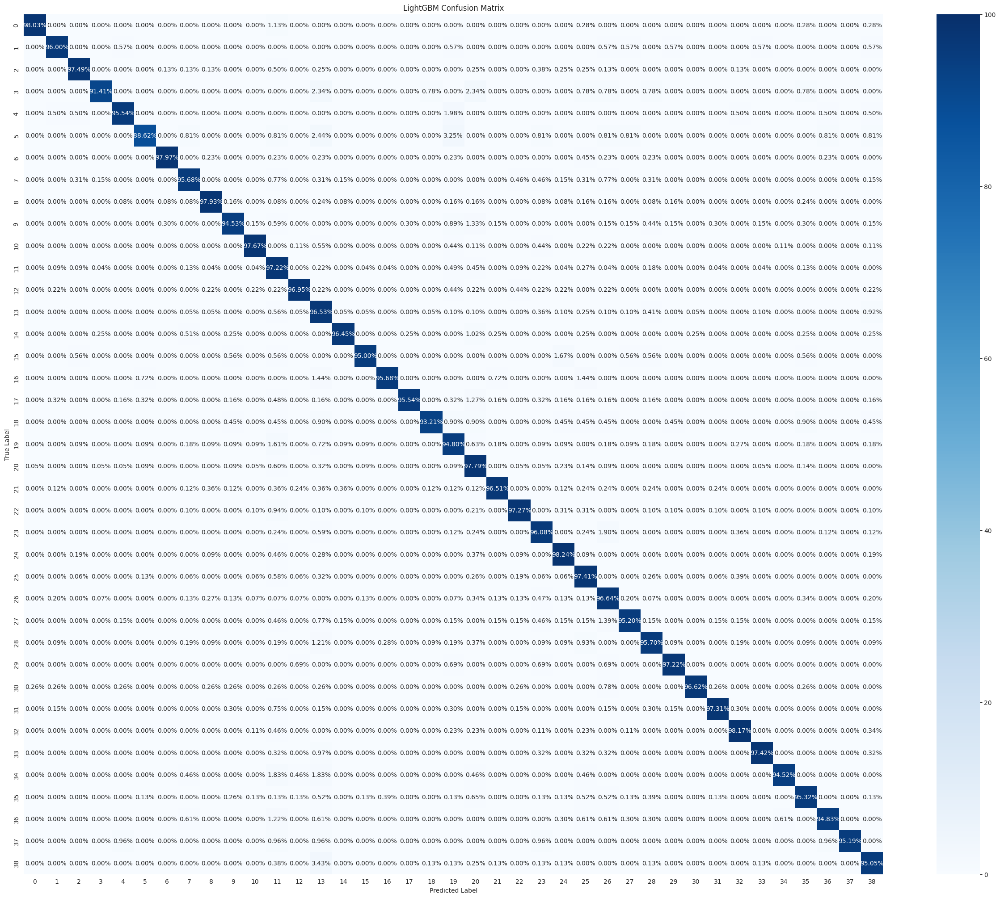

In [117]:
hf.confusion_matrix_plot(y_test, lgbm.predict(X_test), 'LightGBM', 'Section/LightGBM_cm', figsize=(31,25))

In [118]:
def objective_lgbm_section(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        # 'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'max_depth': trial.suggest_int('max_depth', -1, 20, 2),
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.2, 0.3),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.2, 0.3),
        # 'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),  # L1 regularization
        # 'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),  # L2 regularization
        'n_jobs': -1,
        'verbose': -1,
    }

    # Create and fit the model
    lgbm = LGBMClassifier(**params)
    score = cross_val_score(lgbm, X_train, y_train, cv=2, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [119]:
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm_section, n_trials=10)

[I 2024-09-19 00:47:32,356] A new study created in memory with name: no-name-0461c341-88e7-4663-9c29-6a121425232a
[I 2024-09-19 00:48:43,136] Trial 0 finished with value: 0.5745861680806892 and parameters: {'n_estimators': 150, 'max_depth': 5, 'num_leaves': 225, 'min_child_samples': 13, 'subsample': 0.2207814931663582, 'colsample_bytree': 0.20728141635232195}. Best is trial 0 with value: 0.5745861680806892.
[I 2024-09-19 00:49:02,199] Trial 1 finished with value: 0.7669260312292365 and parameters: {'n_estimators': 50, 'max_depth': 1, 'num_leaves': 300, 'min_child_samples': 24, 'subsample': 0.2295189206913236, 'colsample_bytree': 0.21988477638230686}. Best is trial 1 with value: 0.7669260312292365.
[I 2024-09-19 00:54:43,555] Trial 2 finished with value: 0.568248060260955 and parameters: {'n_estimators': 200, 'max_depth': 17, 'num_leaves': 226, 'min_child_samples': 18, 'subsample': 0.2302854631502538, 'colsample_bytree': 0.23052441688037414}. Best is trial 1 with value: 0.76692603122923

In [120]:
print('Best trial:')
trial = study_lgbm.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.960060033054738
Params: 
  n_estimators: 150
  max_depth: 15
  num_leaves: 122
  min_child_samples: 11
  subsample: 0.27413341143399295
  colsample_bytree: 0.20732233250557064


In [121]:
trials_df = study_lgbm.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_max_depth,params_min_child_samples,params_n_estimators,params_num_leaves,params_subsample,state
9,9,0.960060,2024-09-19 01:11:15.145397,2024-09-19 01:16:46.374230,0 days 00:05:31.228833,0.207322,15,11,150,122,0.274133,COMPLETE
3,3,0.944821,2024-09-19 00:54:43.556581,2024-09-19 00:55:13.689814,0 days 00:00:30.133233,0.250863,3,24,50,112,0.261849,COMPLETE
1,1,0.766926,2024-09-19 00:48:43.137854,2024-09-19 00:49:02.199429,0 days 00:00:19.061575,0.219885,1,24,50,300,0.229519,COMPLETE
7,7,0.651514,2024-09-19 01:08:29.025191,2024-09-19 01:10:14.091022,0 days 00:01:45.065831,0.265604,7,25,100,65,0.276587,COMPLETE
4,4,0.577012,2024-09-19 00:55:13.691103,2024-09-19 01:04:37.805731,0 days 00:09:24.114628,0.264091,17,22,200,239,0.265132,COMPLETE


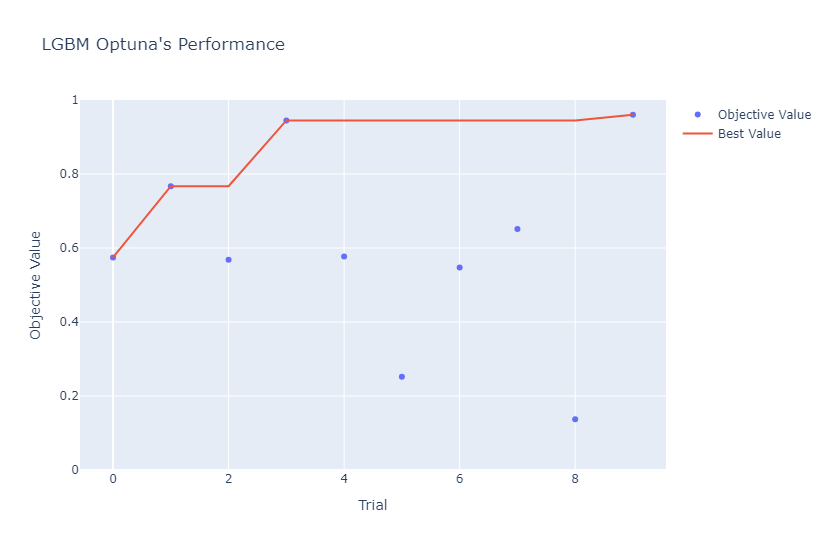

In [122]:
fig = plot_optimization_history(study_lgbm)
fig.update_layout(yaxis_range=[0, 1], title="LGBM Optuna's Performance", width=930, height=550)
fig.show()

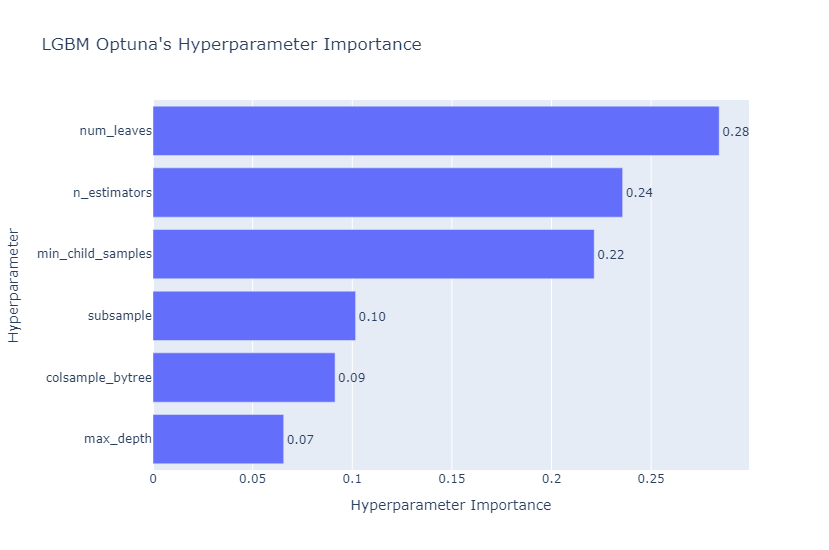

In [123]:
fig = plot_param_importances(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

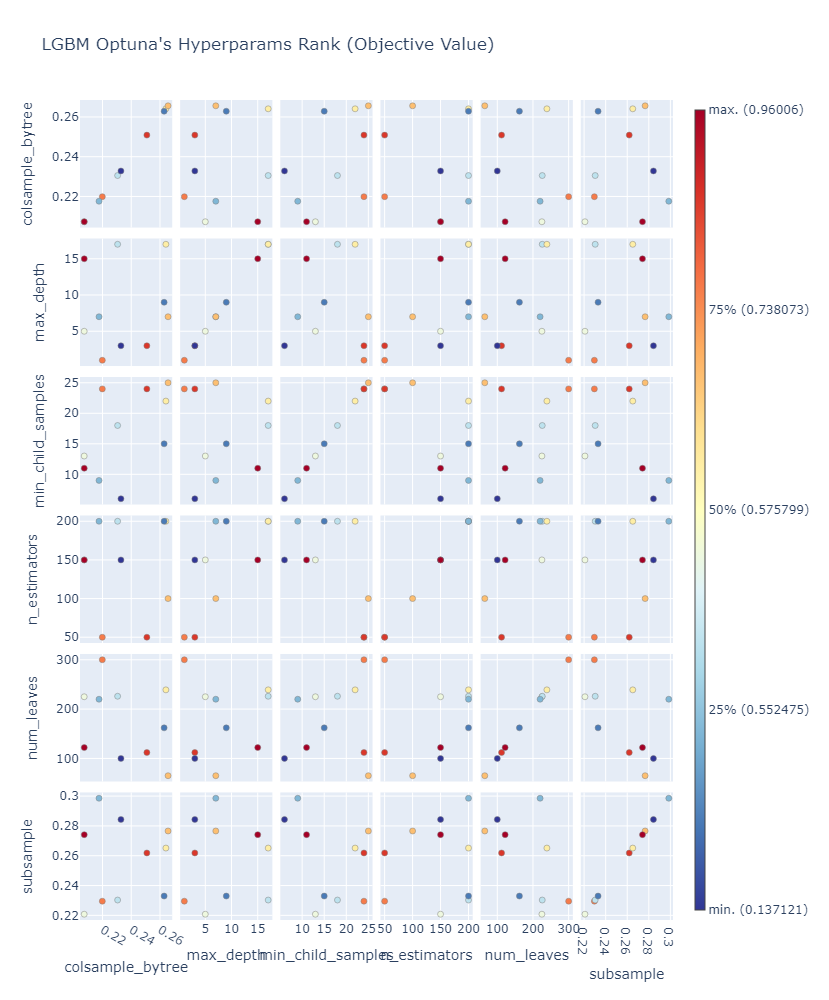

In [124]:
fig = plot_rank(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparams Rank (Objective Value)", width=1030, height=1000)
fig.show()

In [125]:
lgbm_section = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_section.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.20732233250557064, max_depth=15,
               min_child_samples=11, n_estimators=150, num_leaves=122,
               subsample=0.27413341143399295)

In [126]:
lgbm_section.score(X_test, y_test)

0.2295772156377145

In [127]:
print(classification_report(y_test, lgbm_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.08      0.17      0.11       355
                            SECTION I. EXISTENCE       0.00      0.00      0.00       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.22      0.50      0.30       797
                    SECTION I. MATTER IN GENERAL       0.67      0.02      0.03       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.63      0.41      0.49       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.00      0.00      0.00       123
                     SECTION I. SPACE IN GENERAL       0.32      0.69      0.43       444
                  SECTION I. VOLITION IN GENERAL       0.69      0.22      0.33       648
                          SECTION II. DIMENSIONS       0.29      0.27      0.28      1259
                    SECTION II. INORGANIC MATTER       0.06      0.06      0.06       676
         

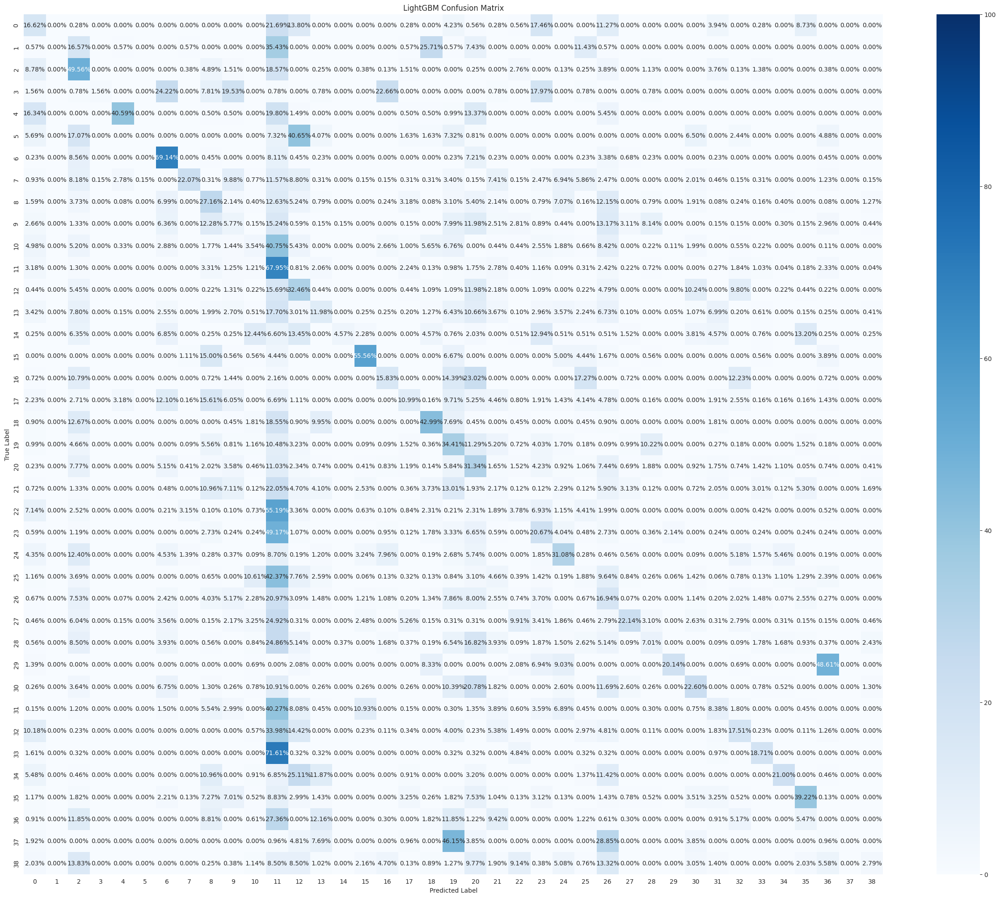

In [128]:
hf.confusion_matrix_plot(y_test, lgbm_section.predict(X_test), 'LightGBM', 'Section/LightGBM_cm_optuna', figsize=(31,25))

## 5. ML Comparison

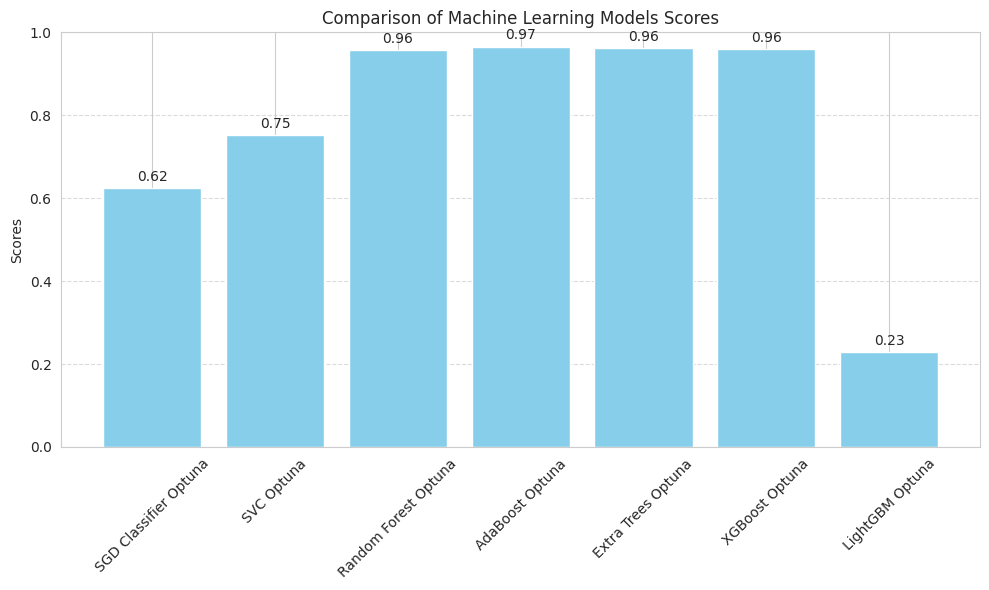

In [129]:
model_objects = {
    'SGD Classifier Optuna': sgd_section,
    'SVC Optuna': svc_section,
    'Random Forest Optuna': rf_section,
    'AdaBoost Optuna': adaboost_section,
    'Extra Trees Optuna': etc_section,
    'XGBoost Optuna': xgboost_section,
    'LightGBM Optuna': lgbm_section
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost Optuna':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Section/Machine_Learning_results_with_optuna.png')
plt.show()

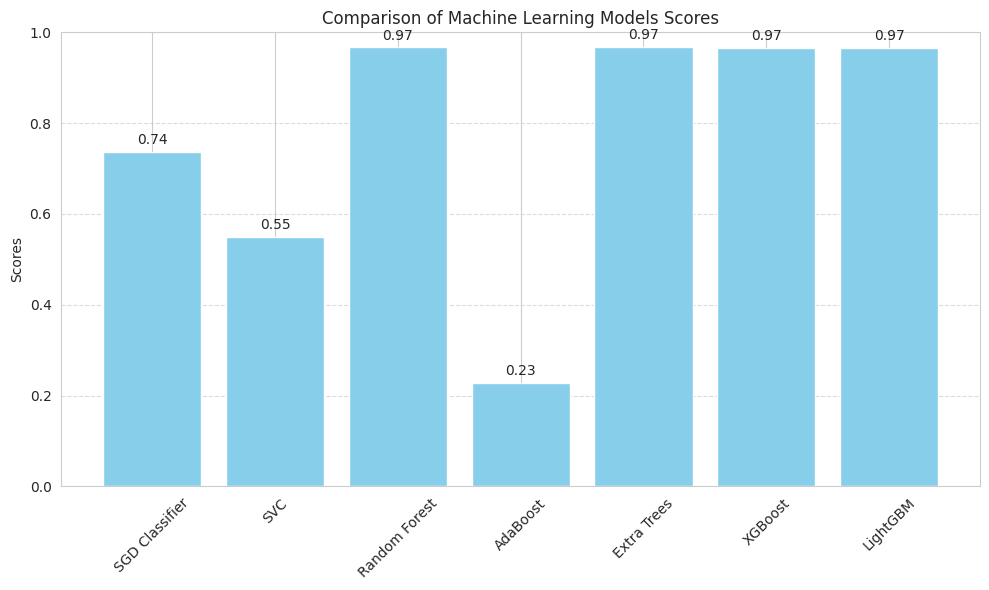

In [130]:
model_objects = {
    'SGD Classifier': sgd,
    'SVC': svc,
    'Random Forest': rf,
    'AdaBoost': adaboost,
    'Extra Trees': etc,
    'XGBoost': xgboost,
    'LightGBM': lgbm
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Section/Machine_Learning_results.png')
plt.show()

In [131]:
dump(lgbm, 'Models/Section/lgbm.joblib')

['Models/Section/lgbm.joblib']

In [132]:
dump(xgboost, 'Models/Section/xgboost.joblib')

['Models/Section/xgboost.joblib']

## 6. Deep Learning